# GEOG6670 Final Project - Vanniman 
## Environmental Risks

Preparing notebook and environment

In [1]:
import ee
import geemap
import os
import geopandas as gpd
import pandas as pd

In [2]:
pd.set_option('display.max_rows', None)

pd.set_option('display.max_columns', None)

Setting up Earth Engine/Geemap

In [3]:
Map = geemap.Map()
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', transp…

Bringing in Population Density Data from Earth Engine Dataset

In [4]:
earthengdata = ee.ImageCollection('CIESIN/GPWv411/GPW_Population_Density').first();
popband = earthengdata.select('population_density');
popband_vis = {
  'max': 1000.0,
  'palette': [
    'ffffff',
    'feedde',
    'fdbe85',
    'fd8d3c',
    'e6550d',
    'a63603'
  ],
  'min': 200.0
};
Map.setCenter(-85, 45, 6
);
Map.addLayer(popband, popband_vis, 'population_density');

Failed Attempts to Bring in Counties and Convert to Earth Engine Feature

In [ ]:
us_counties = gpd.read_file('nhgis0048_shapefile_tl2024_us_county_2024/US_county_2024.shp')
us_counties.info()

In [ ]:
us_counties = gpd.read_file('nhgis0048_shapefile_tl2024_us_county_2024/US_county_2024.shp')
us_counties.head()

In [ ]:
us_counties = gpd.read_file('nhgis0048_shapefile_tl2024_us_county_2024/US_county_2024.shp')
filtered_mi_counties = us_counties[us_counties['STATEFP'] == '26']
filtered_mi_counties.info()

In [ ]:
mi_counties_layer = geemap.gdf_to_ee(filtered_mi_counties)
mi_counties_layer

In [ ]:
Map.addLayer(mi_counties_layer, {}, "Michigan Counties")
Map

Tring to Pull in from ArcGIS API, Did Not Work

In [ ]:
url = "https://services3.arcgis.com/dxRQUfTDNtfqZ301/arcgis/rest/services/County/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
mi_counties_layer1 = gpd.read_file(url)
mi_counties_layer1.info()

In [ ]:
mi_counties_eartheng = geemap.gdf_to_ee(mi_counties_layer1)
mi_counties_eartheng

In [ ]:
Map.addLayer(mi_counties_eartheng, {}, "Michigan Counties")
Map

Bringing in County Layer from Earth Engine Instead and Filtering to Michigan - This was Utilized

In [5]:
counties = ee.FeatureCollection('TIGER/2018/Counties')
filtered = counties.filter(ee.Filter.eq('STATEFP', '26'))
Map.addLayer(filtered, {}, "Michigan Counties")
Map

Map(bottom=6194.0, center=[45, -85], controls=(WidgetControl(options=['position', 'transparent_bg'], position=…

Using Counties from Earth Engine to Extract Population from Earth Engine

In [6]:
earthengdata = ee.ImageCollection('CIESIN/GPWv411/GPW_Population_Density').first()
geemap.extract_values_to_points(filtered, earthengdata)
#Using county pollygons to extract population density values from Earth Engine

Selecting of 2020 Population Density Band

In [7]:
popden2020 = (
    ee.ImageCollection('CIESIN/GPWv411/GPW_Population_Density')
    .filterDate('2020-01-01', '2021-01-01')
    .first()
)
popden2020_raster = popden2020.select('population_density')
#Selection of 2020 population density 

Calculating Population Statistics for Each County - Mean, Median, Minimum, Maximum, and Standard Deviation

In [8]:
scale = popden2020_raster.projection().nominalScale()
county_stats = popden2020_raster.reduceRegions(
    collection=filtered,
    reducer=(
        ee.Reducer.count()
        .combine(ee.Reducer.mean(), sharedInputs=True)
        .combine(ee.Reducer.median(), sharedInputs=True)
        .combine(ee.Reducer.minMax(), sharedInputs=True)
        .combine(ee.Reducer.stdDev(), sharedInputs=True)
    ),
    scale=scale,
    tileScale=4,
    crs=popden2020_raster.projection(),
)
mi_counties_pop = geemap.ee_to_gdf(county_stats)
mi_counties_pop.head()
#Calculated statistics for entire polygons instead of individual cells

,geometry,ALAND,AWATER,CBSAFP,CLASSFP,COUNTYFP,COUNTYNS,CSAFP,FUNCSTAT,GEOID,INTPTLAT,INTPTLON,LSAD,METDIVFP,MTFCC,NAME,NAMELSAD,STATEFP,count,max,mean,median,min,stdDev
0,"POLYGON ((-84.16811 43.56888, -84.15922 43.568...",1145397300,488150978,13020,H1,017,01622951,474,A,26017,+43.6997112,-083.9787007,06,,G4020,Bay,Bay County,26,2766,3314.407227,68.745160,4.715095,0.0,220.886991
1,"POLYGON ((-84.6081 43.6231, -84.60805 43.62238...",1337113497,30578223,33220,H1,111,01622998,474,A,26111,+43.6482031,-084.3794144,06,,G4020,Midland,Midland County,26,2272,1825.002319,63.789944,19.938750,0.0,179.707731
2,"POLYGON ((-84.36999 43.43387, -84.36995 43.422...",2073196027,40145325,40980,H1,145,01623015,474,A,26145,+43.3282667,-084.0554100,06,,G4020,Saginaw,Saginaw County,26,3523,3429.842285,91.400130,22.889958,0.0,247.070958
3,"POLYGON ((-87.20778 41.76094, -87.19122 41.761...",1470535560,2625457933,35660,H1,021,01622953,515,A,26021,+41.7913818,-086.7425435,06,,G4020,Berrien,Berrien County,26,6564,2469.323975,39.669177,1.205946,0.0,143.152825
4,"POLYGON ((-86.22609 41.7604, -86.22556 41.7604...",1269367168,47147839,43780,H1,027,01622956,515,A,26027,+41.9172431,-086.0001420,06,,G4020,Cass,Cass County,26,2128,1639.354736,46.219843,19.566626,0.0,103.137401


Viewing Information to Ensure only Michigan Counties were Utilized

In [9]:
mi_counties_pop.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 83 entries, 0 to 82
Data columns (total 24 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  83 non-null     geometry
 1   ALAND     83 non-null     int64   
 2   AWATER    83 non-null     int64   
 3   CBSAFP    83 non-null     object  
 4   CLASSFP   83 non-null     object  
 5   COUNTYFP  83 non-null     object  
 6   COUNTYNS  83 non-null     object  
 7   CSAFP     83 non-null     object  
 8   FUNCSTAT  83 non-null     object  
 9   GEOID     83 non-null     object  
 10  INTPTLAT  83 non-null     object  
 11  INTPTLON  83 non-null     object  
 12  LSAD      83 non-null     object  
 13  METDIVFP  83 non-null     object  
 14  MTFCC     83 non-null     object  
 15  NAME      83 non-null     object  
 16  NAMELSAD  83 non-null     object  
 17  STATEFP   83 non-null     object  
 18  count     83 non-null     int64   
 19  max       83 non-null     float64 
 20  mean

Changing Projection of Counties and Simplifying Geometry

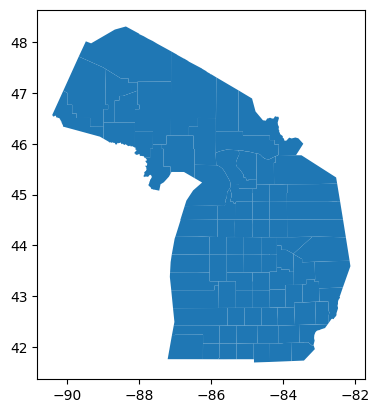

In [10]:
gdfMICounties = mi_counties_pop[["GEOID", "geometry", "mean"]].to_crs(5070).copy()
gdfMICounties["geometry"] = gdfMICounties.geometry.simplify(300, preserve_topology=True)
gdfMICounties = gdfMICounties.to_crs(4326)

gdfMICounties.plot();

Final Layer of Michigan Counties with Population Density to Earth Engine Layer/Feature

In [11]:
fullPopulationLayer = geemap.gdf_to_ee(gdfMICounties)

Importing Libraries for Plotting

In [12]:
import matplotlib.pyplot as plt
from enum import Enum

Setting Up Function for Mapping

In [13]:
class ColorRamps(Enum):
    SEISMIC = 'seismic'
    MAGMA = 'magma'
    INFERNO = 'inferno'
    VIRIDIS = 'viridis'
    CIVIDIS = 'cividis'
    RAINBOW = 'rainbow'

class Schemes(Enum):
    NATURAL_BREAKS = 'natural_breaks'
    QUANTILES = 'quantiles'
    EQUAL_INTERVAL = 'equal_interval'

def plot_map_by_column(
        gdf: gpd.GeoDataFrame, 
        column: float, 
        color_ramp: ColorRamps, 
        scheme: Schemes,
        title: str):
    fig, ax = plt.subplots(figsize=(12, 8), facecolor="#1a1a1a")
    plot = gdf.plot(
        ax=ax,
        column=column,
        cmap=color_ramp.value,
        edgecolor="white",
        linewidth=0.3,
        legend=True,
        scheme=scheme.value,
        legend_kwds={
            'labelcolor': 'white',
            "loc": "center left", 
            'frameon': False},
        alpha=0.6
    )
    plt.title(f"{title}", fontsize=16, color="white")
    ax.set_axis_off()

Mapping Population Density to Ensure Correct

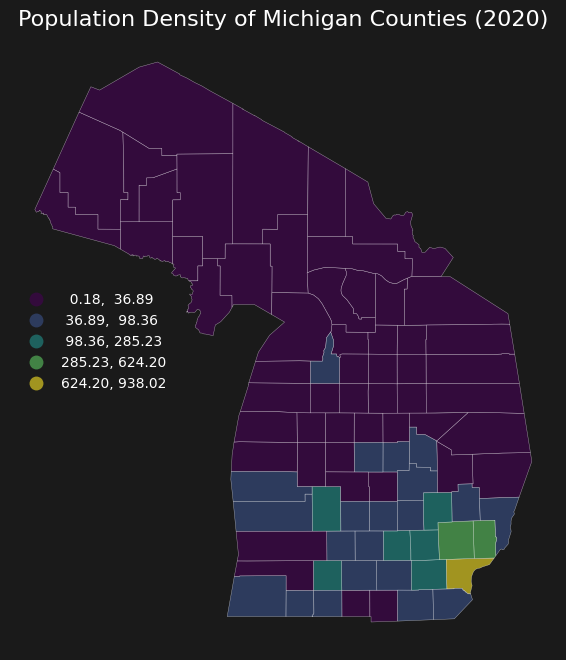

In [14]:
plot_map_by_column(
    gdf=gdfMICounties, 
    column='mean', 
    color_ramp=ColorRamps.VIRIDIS, 
    scheme=Schemes.NATURAL_BREAKS,
    title="Population Density of Michigan Counties (2020)"
)

Setting up SVI Data

In [15]:
miSVIdata = gpd.read_file("Michigan_county1.csv")
miSVIdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83 entries, 0 to 82
Columns: 158 entries, ST to MP_OTHERRACE
dtypes: object(158)
memory usage: 102.6+ KB


In [16]:
miSVIdata.dtypes

ST              object
STATE           object
ST_ABBR         object
STCNTY          object
COUNTY          object
FIPS            object
LOCATION        object
AREA_SQMI       object
E_TOTPOP        object
M_TOTPOP        object
E_HU            object
M_HU            object
E_HH            object
M_HH            object
E_POV150        object
M_POV150        object
E_UNEMP         object
M_UNEMP         object
E_HBURD         object
M_HBURD         object
E_NOHSDP        object
M_NOHSDP        object
E_UNINSUR       object
M_UNINSUR       object
E_AGE65         object
M_AGE65         object
E_AGE17         object
M_AGE17         object
E_DISABL        object
M_DISABL        object
E_SNGPNT        object
M_SNGPNT        object
E_LIMENG        object
M_LIMENG        object
E_MINRTY        object
M_MINRTY        object
E_MUNIT         object
M_MUNIT         object
E_MOBILE        object
M_MOBILE        object
E_CROWD         object
M_CROWD         object
E_NOVEH         object
M_NOVEH    

In [17]:
miSVIdata['SPL_THEMES'] = miSVIdata['SPL_THEMES'].astype(float)


In [18]:
miSVIdata.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
0,26,Michigan,MI,26001,Alcona County,26001,"Alcona County, Michigan",674.65503626248,10238,0,10320,52,4832,160,2417,230,239,61,1035,103,741,81,434,79,3693,17,1317,25,2339,159,90,28,5,64,635,62,54,23,985,119,44,21,168,46,116,16,23.9,2.3,6.3,1.6,21.4,2.0,8.8,1.0,4.3,0.8,36.1,0.2,12.9,0.2,23.0,1.6,1.8,0.6,0.1,0.6,6.2,0.6,0.5,0.2,9.5,1.2,0.9,0.4,3.5,0.9,1.1,0.2,0.561,0.622,0.3902,0.5976,0.1341,2.3049,0.4146,0.9878,0.0122,0.9268,0.0122,0.0488,1.9878,0.1951,0.1098,0.1098,0.1098,0.0244,0.7317,0.1341,0.0732,0.1829,1.1463,0.0366,5.5488,0.1098,0,0,0,0,0,0,1,0,1,0,0,2,0,0,0,0,0,0,0,0,2,7673,966,107,44,25,189,0,32,17,31,17,2,5,311,72,26,18,20.0,2.1,0.4,0.2,1.8,0.0,0.3,0.2,0.3,0.2,0.0,0.1,3.0,0.7,0.3,0.2
1,26,Michigan,MI,26003,Alger County,26003,"Alger County, Michigan",915.03382096438,8866,0,6208,32,3274,162,1478,224,156,56,716,130,411,104,278,102,2218,34,1599,83,1436,147,96,42,0,60,1600,32,206,65,434,84,56,37,193,74,1050,27,18.9,2.9,5.1,1.9,21.9,3.8,6.3,1.6,3.5,1.3,25.0,0.4,18.0,0.9,18.3,1.9,2.9,1.3,0.0,0.7,18.0,0.4,3.3,1.0,7.0,1.3,1.7,1.1,5.9,2.2,11.8,0.3,0.2561,0.4024,0.5488,0.2317,0.0366,1.4756,0.1707,0.6829,0.2805,0.6951,0.0854,0.0,1.7439,0.1098,0.7561,0.7561,0.7561,0.439,0.4512,0.622,0.4634,0.9634,2.939,0.7683,6.9146,0.2927,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,8142,532,95,691,69,175,0,70,66,283,117,0,15,375,119,6,8,16.2,2.8,7.8,0.8,2.0,0.0,0.8,0.7,3.2,1.3,0.0,0.3,4.2,1.3,0.1,0.1
2,26,Michigan,MI,26005,Allegan County,26005,"Allegan County, Michigan",825.25275070038,120189,0,51880,87,44621,588,20873,1611,1991,351,8268,605,6856,774,6110,924,20871,113,28389,0,12629,678,2786,497,899,270,16597,757,1348,327,5670,435,1048,254,1365,242,1273,26,17.6,1.4,3.4,0.6,18.5,1.3,8.3,0.9,5.1,0.8,17.4,0.1,23.6,0.0,10.6,0.6,6.2,1.1,0.8,100.0,13.8,0.6,2.6,0.6,10.9,0.8,2.4,0.6,3.1,0.5,1.1,0.0,0.1951,0.0122,0.0366,0.5122,0.3415,1.0976,0.0976,0.0976,0.9634,0.0244,0.8415,0.8293,2.7562,0.7073,0.6341,0.6341,0.6341,0.3415,0.7927,0.9268,0.0488,0.1829,2.2927,0.4268,6.7806,0.2805,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,2,103326,5013,424,1520,280,9301,0,872,115,287,101,21,25,4133,847,463,498,11.2,0.9,1.3,0.2,7.7,0.0,0.7,0.1,0.2,0.1,0.0,0.1,3.4,0.7,0.4,0.4
3,26,Michigan,MI,26007,Alpena County,26007,"Alpena County, Michigan",571.896276230728,28911,0,15685,49,12721,266,7951,722,966,216,2685,286,1552,194,1563,279,6935,56,5373,26,5685,394,714,147,34,70,1663,188,667,153,980,146,115,60,1145,187,526,57,28.0,2.5,7.4,1.6,21.1,2.2,7.2,0.9,5.5,1.0,24.0,0.2,18.6,0.1,19.9,1.4,5.6,1.1,0.1,0.3,5.8,0.7,4.3,1.0,6.2,0.9,0.9,0.5,9.0,1.4,1.8,0.2,0.878,0.8537,0.3415,0.3049,0.4512,2

Joining Population Density Data in Counties with SVI Data

In [19]:
gdf_popSVI = gdfMICounties.merge(miSVIdata, left_on='GEOID', right_on='STCNTY', how='left')
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1,2.8,0.4,0.1,0.1
3,26021,"POLYGON ((-87.20778 41.76094, -86.22609 41.760...",39.669177,26,Michigan,MI,26021,Berrie

Setting Up Hazardous Waste Data

In [20]:
miHazWaste = gpd.read_file("Michigan_Hazardous_Waste_Treatment%2C_Storage%2C_and_Disposal_Facilities.geojson")
miHazWaste.info()
#Setting up hazardous waste data and looking at information

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   WDSId                       236 non-null    int32              
 1   SiteId                      236 non-null    object             
 2   SiteSpecificName            236 non-null    object             
 3   LegalName                   236 non-null    object             
 4   Address                     236 non-null    object             
 5   City                        236 non-null    object             
 6   County                      236 non-null    object             
 7   Latitude                    236 non-null    float64            
 8   Longitude                   236 non-null    float64            
 9   CoordinateSystem            236 non-null    object             
 10  HorizontalCollectionMethod  236 non-null    object    

In [21]:
miHazWaste.head()

,WDSId,SiteId,SiteSpecificName,LegalName,Address,City,County,Latitude,Longitude,CoordinateSystem,HorizontalCollectionMethod,FacilityType,Commercial,CommercialFacility,PermitWorkLoad,CorrectiveActionWorkLoad,FederallyRegulatedTSD,Permitted,CorrectiveActionAndPermit,Hyperlink,Echo,Updated,geometry
0,391879,MI0571924760,DEPT/DEFENSE FRMR US AIR FORCE KI SAWYER AFB,US DEPT/DEFENSE,402 3RD ST,GWINN,MARQUETTE,46.36422,-87.38239,WGS-84,Submitted by Handler,TS,<strong>does not accept</strong> offsite hazar...,does not accept offsite hazardous waste,-1,-1,-1,0,-1,https://www.egle.state.mi.us/wdspi/Dashboard.a...,http://echo.epa.gov/detailed-facility-report?f...,2026-04-22 01:20:07.110000+00:00,POINT (-87.38239 46.36422)
1,391949,MI5210022781,US ARMY - DETROIT ARSENAL,US DEPT/DEFENSE,6501 E 11 MILE RD,WARREN,MACOMB,42.49196,-83.04155,WGS-84,Lat/Long Interpolation,S,<strong>does not accept</strong> offsite hazar...,does not accept offsite hazardous waste,-1,-1,0,0,-1,https://www.egle.state.mi.us/wdspi/Dashboard.a...,http://echo.epa.gov/detailed-facility-report?f...,2026-04-22 01:20:07.110000+00:00,POINT (-83.04155 42.49196)
2,391955,MI5570024278,US AIR FORCE WURTSMITH AFB,US DEPT/DEFENSE,3950 ARROW ST,OSCODA,IOSCO,44.45154,-83.36329,WGS-84,Lat/Long Interpolation,TS,<strong>does not accept</strong> offsite hazar...,does not accept offsite hazardous waste,-1,-1,0,0,-1,https://www.egle.state.mi.us/wdspi/Dashboard.a...,http://echo.epa.gov/detailed-facility-report?f...,2026-04-22 01:20:07.110000+00:00,POINT (-83.36329 44.45154)
3,392019,MID000266957,ROZEMA INDUSTRIAL WASTE INC,ROZEMA INDUSTRIAL WASTE INC,2650 THORNWOOD ST SW,WYOMING,KENT,42.91723,-85.73189,WGS-84,Lat/Long Interpolation,TS,<strong>does not accept</strong> offsite hazar...,does not accept offsite hazardous waste,-1,-1,0,0,-1,https://www.egle.state.mi.us/wdspi/Dashboard.a...,http://echo.epa.gov/detailed-facility-report?f...,2026-04-22 01:20:07.110000+00:00,POINT (-85.73189 42.91723)
4,392032,MID000647032,ROZEMA INDUSTRIAL WASTE INC,ROZEMA INDUSTRIAL WASTE INC,2900 PEACH RIDGE AVE NW,WALKER,KENT,43.01678,-85.73864,WGS-84,Lat/Long Interpolation,TS,<strong>does not accept</strong> offsite hazar...,does not accept offsite hazardous waste,-1,-1,0,0,-1,https://www.egle.state.mi.us/wdspi/Dashboard.a...,http://echo.epa.gov/detailed-facility-report?f...,2026-04-22 01:20:07.110000+00:00,POINT (-85.73864 43.01678)


Setting Up Solid Waste Data

In [22]:
miSolWaste = gpd.read_file("Michigan_Part_115_Solid_Waste_Landfills.geojson")
miSolWaste.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   OID                 71 non-null     int32   
 1   show                71 non-null     int32   
 2   module              71 non-null     object  
 3   wdsid               71 non-null     int32   
 4   legalsitename       71 non-null     object  
 5   specificsitename    71 non-null     object  
 6   actcode             71 non-null     object  
 7   facilitytype        71 non-null     object  
 8   addrline1           71 non-null     object  
 9   addrline2           71 non-null     object  
 10  city                71 non-null     object  
 11  state               71 non-null     object  
 12  zip                 71 non-null     object  
 13  countyname          71 non-null     object  
 14  districtname        71 non-null     object  
 15  latdeccord          69 non-null   

In [23]:
miSolWaste.head()

,OID,show,module,wdsid,legalsitename,specificsitename,actcode,facilitytype,addrline1,addrline2,city,state,zip,countyname,districtname,latdeccord,longdeccord,p115status,p115authexprdate,compoststatus,compostregexprdate,ewasteregexprdate,scraptirestatus,scraptireexprdate,endusercmpltype,endusercmpldate,disposalareastatus,landfilllink,Shape,geometry
0,3,1,SolidWaste,390701,REPUBLIC SERVICES OF MICHIGAN I LLC,CARLETON FARMS LANDFILL,II,Type II MSW Landfill,28800 CLARK RD,,NEW BOSTON,MI,48164,WAYNE,WARREN,42.09359,-83.42138,None,None,None,None,None,None,None,None,None,Active - Accepting,https://www.michigan.gov/egle/about/organizati...,None,POINT (-83.42138 42.09359)
1,4,1,SolidWaste,390701,REPUBLIC SERVICES OF MICHIGAN I LLC,CARLETON FARMS LANDFILL,II-Ash,Type II MSW Incinerator Ash Landfill,28800 CLARK RD,,NEW BOSTON,MI,48164,WAYNE,WARREN,42.09359,-83.42138,None,None,None,None,None,None,None,None,None,Active - Accepting,https://www.michigan.gov/egle/about/organizati...,None,POINT (-83.42138 42.09359)
2,8,1,SolidWaste,391216,GFL ENVIRONMENTAL USA INC,GFL NORTH MICHIGAN LANDFILL LLC,II,Type II MSW Landfill,20667 5 MILE HWY,,ONAWAY,MI,49765,PRESQUE ISLE,GAYLORD USE BAY CITY,45.28235,-84.2192,None,None,None,None,None,None,None,None,None,Active - Accepting,https://www.michigan.gov/egle/about/organizati...,None,POINT (-84.2192 45.28235)
3,13,1,SolidWaste,392562,DETROIT EDISON CO,DETROIT EDISON CO RANGE RD ASH DISPOSAL,III-CAL,Type III-Coal Ash Landfill,3600 RANGE RD,,SAINT CLAIR,MI,48079,ST CLAIR,WARREN,42.79831,-82.49372,None,None,None,None,None,None,None,None,None,Active - Accepting,https://www.michigan.gov/egle/about/organizati...,None,POINT (-82.49372 42.79831)
4,15,1,SolidWaste,392616,DETROIT EDISON CO,DETROIT EDISON CO SIBLEY QUARRY,III-CAL,Type III-Coal Ash Landfill,3801 FORT ST,,TRENTON,MI,48183,WAYNE,WARREN,42.16119,-83.18811,None,None,None,None,None,None,None,None,None,Active - Accepting,https://www.michigan.gov/egle/about/organizati...,None,POINT (-83.18811 42.16119)


Setting Up Environmental Contamination Data

In [24]:
miEnviCont = gpd.read_file("Part_201_Environmental_Contamination_Sites.geojson")
miEnviCont.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18737 entries, 0 to 18736
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   OBJECTID                    18737 non-null  int32              
 1   SiteName                    18737 non-null  object             
 2   Address                     18737 non-null  object             
 3   City                        16645 non-null  object             
 4   ZipCode                     18737 non-null  object             
 5   County                      18737 non-null  object             
 6   Latitude                    18737 non-null  float64            
 7   Longitude                   18737 non-null  float64            
 8   SiteID                      18737 non-null  object             
 9   BusinessType                11956 non-null  object             
 10  HorizontalReferenceDatum    17703 non-null  object

In [25]:
miEnviCont.head()

,OBJECTID,SiteName,Address,City,ZipCode,County,Latitude,Longitude,SiteID,BusinessType,HorizontalReferenceDatum,HorizontalCollectionMethod,HorizontalAccuracy,ReferencePoint,SourceMapScale,RiskCondition,Contaminants,HasBeaOrNom,LastUpdated,ProjectManaager,geometry
0,1,Iron Skillet Lincoln,101 N Lake St,Lincoln,48742,Alcona,44.683646,-83.413146,01000004,None,North American Datum of 1983,The geographic coordinate determination method...,20.0,Center of a facility or station,24000.0,Risks Controlled-Interim,Petroleum Volatile and Semi Volatile Organic C...,NO,2021-02-02 00:00:00+00:00,"Schwab, Jared",MULTIPOINT ((-83.41315 44.68365))
1,2,Lincoln Vlg Hardware,901 N Barlow Rd,Lincoln,48742,Alcona,44.681559,-83.404240,01000005,None,North American Datum of 1983,The geographic coordinate determination method...,20.0,Center of a facility or station,24000.0,Risks Controlled-Interim,"Non-Petroleum Hydrocarbons, Petroleum Volatile...",NO,2021-02-02 00:00:00+00:00,"Schwab, Jared",MULTIPOINT ((-83.40424 44.68156))
2,3,Huron Tool,481 East State Street,Lincoln,48742,Alcona,44.682166,-83.405446,01000009,None,North American Datum of 1983,The geographic coordinate determination method...,20.0,Center of a facility or station,24000.0,Risks Controlled-Interim,"Elements/Metals/Other Inorganics, Not Otherwis...",NO,2026-03-30 00:00:00+00:00,"Schwab, Jared",MULTIPOINT ((-83.40545 44.68217))
3,4,Ron's Repair,2894 S State St,Glennie,48737,Alcona,44.570405,-83.728581,01000021,None,North American Datum of 1983,The geographic coordinate determination method...,20.0,Center of a facility or station,24000.0,Inadequate Data to Assign Risk,Petroleum Volatile and Semi Volatile Organic C...,NO,2025-09-04 00:00:00+00:00,"Schwab, Jared",MULTIPOINT ((-83.72858 44.5704))
4,5,Viking Energy,507 W State St,Lincoln,48742,Alcona,44.679785,-83.418540,01000028,None,North American Datum of 1983,The geographic coordinate determination method...,20.0,Center of a facility or station,24000.0,Risks Controlled-Interim,Petroleum Volatile and Semi Volatile Organic C...,YES,2021-02-02 00:00:00+00:00,"Schwab, Jared",MULTIPOINT ((-83.41854 44.67978))


Setting Up PFAS Data

In [26]:
miPFAS = gpd.read_file("Michigan_PFAS_Sites_and_Areas_of_Interest_PUBLIC_view_-6189690896784766477.geojson")
miPFAS.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 381 entries, 0 to 380
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   OBJECTID                 381 non-null    int32         
 1   SiteOrAoi                381 non-null    object        
 2   Name                     381 non-null    object        
 3   Address                  341 non-null    object        
 4   City                     381 non-null    object        
 5   ZipCode                  344 non-null    float64       
 6   County                   381 non-null    object        
 7   Type                     381 non-null    object        
 8   ResidentialWellsSampled  381 non-null    object        
 9   SiteLead                 381 non-null    object        
 10  SiteLeadEmail            381 non-null    object        
 11  SiteLeadPhone            381 non-null    object        
 12  WebpageSite              380

In [27]:
miPFAS.head()

,OBJECTID,SiteOrAoi,Name,Address,City,ZipCode,County,Type,ResidentialWellsSampled,SiteLead,SiteLeadEmail,SiteLeadPhone,WebpageSite,WebpageAdditionalFiles,Longitude,Latitude,FacilityDate,GlobalID,geometry
0,1,Site,Belmont - House St.,1855 House Street,Rockford,49341.0,Kent County,Landfill,Yes,Leah Gies,giesl1@michigan.gov,616-215-4781,https://www.michigan.gov/pfasresponse/investig...,None,-85.621686,43.105358,NaT,53ff1600-074d-4690-a5d6-d770a0f90acb,POINT Z (-85.62169 43.10536 0)
1,2,Site,Rockford Tannery,123 North Main Street,Rockford,49341.0,Kent County,Tannery,No,Leah Gies,giesl1@michigan.gov,616-215-4781,https://www.michigan.gov/pfasresponse/investig...,None,-85.560182,43.122506,NaT,50169bf5-8c09-4c7a-ba7c-f915c5075882,POINT Z (-85.56018 43.12251 0)
2,3,Site,Camp Grayling - Lake Margrethe,Camp Grayling - Lake Margrethe Area,Grayling,49738.0,Crawford County,Military,Yes,Summer Cox,CoxS12@Michigan.gov,517-275-2805,https://www.michigan.gov/pfasresponse/investig...,None,-84.787790,44.626681,2017-11-03,5886f5fc-2d9b-4b91-8aaf-1d83fca672e6,POINT Z (-84.78779 44.62668 0)
3,4,Site,K.I. Sawyer AFB,225 Airport Ave,Gwinn,49841.0,Marquette County,Military,Yes,Kenneth Heitkamp,HeitkampK@Michigan.gov,517-930-5218,https://www.michigan.gov/pfasresponse/investig...,None,-87.387300,46.349600,2017-10-31,04693d30-78b2-4967-bb37-fcb5832510de,POINT Z (-87.3873 46.3496 0)
4,5,Site,Wurtsmith AFB,No Address - former Air Force Base,Oscoda,48750.0,Iosco County,Military,Yes,Kyle Jump,JumpK@Michigan.gov,517-290-7414,https://www.michigan.gov/pfasresponse/investig...,None,-83.353421,44.459534,2019-05-01,61d238f3-cb26-45e4-ace2-f97eb09d337c,POINT Z (-83.35342 44.45953 0)


Confirming Projections of Layers

In [28]:
print(f'Merged gdf: {gdf_popSVI.crs} - Hazardous Waste: {miHazWaste.crs} - Solid Waste: {miSolWaste.crs} - Environmental Contamination: {miEnviCont.crs}')

Merged gdf: EPSG:4326 - Hazardous Waste: EPSG:4326 - Solid Waste: EPSG:4326 - Environmental Contamination: EPSG:4326


Spatial Join of Hazardous Waste Sites with Dataframe of Population and SVI - Calculating Counts

In [32]:
join1 = gpd.sjoin(miHazWaste, gdf_popSVI, how="inner", predicate="within")
counts1 = join1.groupby('index_right').size()
counts1.head()

index_right
0    3
1    3
2    5
3    7
4    2
dtype: int64

In [33]:
gdf_popSVI['HazWasteCount'] = gdf_popSVI.index.map(counts1).fillna(0)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1,2.8,0.4,0.1,0.1,5.0
3,26021,"POLYGON ((-87.20778 41.76094, -86.22609 41.760...",39.669177,2

Spatial Join of Solid Waste Sites with Dataframe of Population and SVI - Calculating Counts

In [34]:
join2 = gpd.sjoin(miSolWaste, gdf_popSVI, how="inner", predicate="within")
counts2 = join2.groupby("index_right").size()
counts2.head()

index_right
0    1
1    1
2    2
3    2
5    1
dtype: int64

In [35]:
gdf_popSVI['SolWasteCount'] = gdf_popSVI.index.map(counts2).fillna(0)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1,2.8,0.4,0.1,0.1,5.0,2.0
3,26021,"POLYGON ((-87.20778 41.76094, -86.22

Spatial Join of PFAS Sites with Dataframe of Population and SVI - Calculating Counts

In [36]:
join3 = gpd.sjoin(miPFAS, gdf_popSVI, how="inner", predicate="within")
counts3 = join3.groupby("index_right").size()
counts3.head()

index_right
0    7
2    4
3    7
4    1
5    5
dtype: int64

In [38]:
gdf_popSVI['PFASCount'] = gdf_popSVI.index.map(counts3).fillna(0)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1,2.8,0.4,0.1,0.1,5.0,2.0,4.0
3,26021,"POLYGON ((-87.

Spatial Join of Environmental Contamination Sites with Dataframe of Population and SVI - Calculating Counts

In [39]:
join4 = gpd.sjoin(miEnviCont, gdf_popSVI, how="inner", predicate="within")
counts4 = join4.groupby("index_right").size()
counts4.head()

index_right
0    276
1    174
2    385
3    413
4     61
dtype: int64

In [41]:
gdf_popSVI['EnviContCount'] = gdf_popSVI.index.map(counts4).fillna(0)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount,EnviContCount
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0,276
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0,174
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1,2.8,0.4,0.1,0.1,5.0,2.0,4.0,3

Calculating First Envionrnmental Risk Score with Only Hazardous Waste, Solid Waste, PFAS, and Environmental Contamination Site Counts - Adding in Factors to Increase Importance of Hazardous Waste and PFAS Sites

In [42]:
gdf_popSVI['EnvironmentalRisk'] = gdf_popSVI.apply(
    lambda row: (
        row['HazWasteCount'] * 3
        + row['SolWasteCount']
        + row['PFASCount'] * 5
        + row['EnviContCount']
    ),
    axis=1
)

In [43]:
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount,EnviContCount,EnvironmentalRisk
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0,276,321.0
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0,174,184.0
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.4,0.3,9.0,0.0,1.2,0.1,0.2,0.1,0.0,0.1

Calculating Second Envionrnmental Risk Score with Hazardous Waste, Solid Waste, PFAS, and Environmental Contamination Site Counts and Including SVI - Adding in Factors to Increase Importance of Hazardous Waste and PFAS Sites and SVI

In [44]:
gdf_popSVI['EnvironmentalRiskSVI'] = gdf_popSVI.apply(
    lambda row: (
        row['HazWasteCount'] * 3
        + row['SolWasteCount']
        + row['PFASCount'] * 5
        + row['EnviContCount']
        + row['SPL_THEMES'] * 10
    ),
    axis=1
)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount,EnviContCount,EnvironmentalRisk,EnvironmentalRiskSVI
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0,276,321.0,393.803
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0,174,184.0,247.172
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,235,336,119,53,69,5225,689,207,116,13.6,0.8,18.

Calculating Third Envionrnmental Risk Score with Hazardous Waste, Solid Waste, PFAS, and Environmental Contamination Site Counts and Including SVI and Population - Adding in Factors to Increase Importance of Hazardous Waste and PFAS Sites, SVI, and Population

In [45]:
gdf_popSVI['EnvironmentalRiskSVIPop'] = gdf_popSVI.apply(
    lambda row: (
        row['HazWasteCount'] * 3
        + row['SolWasteCount']
        + row['PFASCount'] * 5
        + row['EnviContCount']
        + row['SPL_THEMES'] * 10
        + row['mean'] * 5
    ),
    axis=1
)
gdf_popSVI.head()

,GEOID,geometry,mean,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount,EnviContCount,EnvironmentalRisk,EnvironmentalRiskSVI,EnvironmentalRiskSVIPop
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0,276,321.0,393.803,737.528799
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0,174,184.0,247.172,566.121721
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0.7561,0.6098,0.9512,0.4878,3.1951,0.9268,0.9634,0.9634,0.9634,0.8293,0.0854,0.2561,0.878,0.7561,2.8049,0.6585,10.2683,0.8902,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,2,198325,10599,636,34953,512,17159,0,2266,2

Summary Statistics in Duckdb

In [46]:
import duckdb

In [47]:
duckdf = duckdb.from_df(gdf_popSVI.drop(columns="geometry"))
duckdf.show

<bound method pybind11_detail_function_record_v1_msvc_mt_mscver1944.show of ┌─────────┬────────────────────┬─────────┬──────────┬─────────┬─────────┬────────────────────┬─────────┬──────────────────────────────┬───────────────────┬──────────┬──────────┬─────────┬─────────┬─────────┬─────────┬──────────┬──────────┬─────────┬─────────┬─────────┬─────────┬──────────┬──────────┬───────────┬───────────┬─────────┬─────────┬─────────┬─────────┬──────────┬──────────┬──────────┬──────────┬──────────┬──────────┬──────────┬──────────┬─────────┬─────────┬──────────┬──────────┬─────────┬─────────┬─────────┬─────────┬──────────┬──────────┬───────────┬───────────┬──────────┬──────────┬──────────┬──────────┬───────────┬───────────┬────────────┬────────────┬──────────┬──────────┬──────────┬──────────┬───────────┬───────────┬───────────┬───────────┬───────────┬───────────┬───────────┬───────────┬──────────┬──────────┬───────────┬───────────┬──────────┬──────────┬──────────┬──────────┬───────────┬───────

In [48]:
sql = """
SUMMARIZE SELECT * FROM duckdf;
"""
duckdb.sql(sql)

┌─────────────────────────┬─────────────┬─────────────────────────┬──────────────────────────┬───────────────┬────────────────────┬────────────────────┬────────────────────┬───────────────────┬────────────────────┬───────┬─────────────────┐
│       column_name       │ column_type │           min           │           max            │ approx_unique │        avg         │        std         │        q25         │        q50        │        q75         │ count │ null_percentage │
│         varchar         │   varchar   │         varchar         │         varchar          │     int64     │      varchar       │      varchar       │      varchar       │      varchar      │      varchar       │ int64 │  decimal(9,2)   │
├─────────────────────────┼─────────────┼─────────────────────────┼──────────────────────────┼───────────────┼────────────────────┼────────────────────┼────────────────────┼───────────────────┼────────────────────┼───────┼─────────────────┤
│ GEOID                   │ VARCHAR 

Merging Dataframe with Calculated Scores to Counties for Plotting

In [49]:
final_enviscore = pd.merge(gdfMICounties, gdf_popSVI, on='GEOID')
final_enviscore.head()

,GEOID,geometry_x,mean_x,geometry_y,mean_y,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,E_MINRTY,M_MINRTY,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EP_MINRTY,MP_MINRTY,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSUR,SPL_THEME1,RPL_THEME1,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,EPL_MINRTY,SPL_THEME3,RPL_THEME3,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,RPL_THEMES,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_LIMENG,F_THEME2,F_MINRTY,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRACE,M_OTHERRACE,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE,HazWasteCount,SolWasteCount,PFASCount,EnviContCount,EnvironmentalRisk,EnvironmentalRiskSVI,EnvironmentalRiskSVIPop
0,26017,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,"POLYGON ((-84.16811 43.56888, -84.05002 43.567...",68.745160,26,Michigan,MI,26017,Bay County,26017,"Bay County, Michigan",442.409161617778,103752,0,48598,78,44999,432,22864,1398,2453,378,10192,716,6785,802,5313,806,21607,116,20572,93,16308,838,2993,395,141,112,11488,204,3270,416,2396,331,385,130,3090,409,1215,18,22.2,1.4,4.8,0.8,22.6,1.6,9.0,1.1,5.2,0.8,20.8,0.1,19.8,0.1,15.8,0.8,6.6,0.9,0.1,0.1,11.1,0.2,6.7,0.9,4.9,0.7,0.9,0.3,6.9,0.9,1.2,0.0,0.4268,0.2683,0.6098,0.6341,0.4146,2.3536,0.4634,0.5,0.5122,0.439,0.8902,0.0488,2.3902,0.5,0.561,0.561,0.561,0.7683,0.1829,0.1341,0.6341,0.2561,1.9755,0.2195,7.2803,0.3902,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,94938,5483,533,1288,185,5963,0,529,155,134,60,55,47,3318,269,201,147,12.2,1.2,1.2,0.2,5.7,0.0,0.5,0.1,0.1,0.1,0.1,0.1,3.2,0.3,0.2,0.1,3.0,1.0,7.0,276,321.0,393.803,737.528799
1,26111,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,"POLYGON ((-84.60603 43.81538, -84.60756 43.466...",63.789944,26,Michigan,MI,26111,Midland County,26111,"Midland County, Michigan",517.858854988456,83503,0,36927,62,34336,416,14279,1212,2001,300,7067,636,2974,398,3215,510,16310,131,17607,0,11464,724,1699,274,274,144,8232,291,2778,396,2882,285,432,161,1987,316,1280,45,17.4,1.5,5.0,0.8,20.6,1.8,5.0,0.7,3.9,0.6,19.5,0.2,21.1,0.0,13.8,0.9,4.9,0.8,0.3,0.2,9.9,0.3,7.6,1.1,7.8,0.8,1.3,0.5,5.8,0.9,1.5,0.1,0.1707,0.3659,0.2927,0.1098,0.0732,1.0123,0.0854,0.3659,0.6829,0.1951,0.5976,0.3171,2.1586,0.2927,0.5122,0.5122,0.5122,0.8171,0.5732,0.4024,0.4146,0.4268,2.6341,0.561,6.3172,0.2195,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,83689,4386,497,1253,165,2616,0,1772,183,296,79,0,26,2098,330,197,116,12.8,1.4,1.5,0.2,3.1,0.0,2.1,0.2,0.4,0.1,0.0,0.1,2.5,0.4,0.2,0.1,3.0,1.0,0.0,174,184.0,247.172,566.121721
2,26145,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,"POLYGON ((-84.36977 43.48158, -84.36788 43.128...",91.400130,26,Michigan,MI,26145,Saginaw County,26145,"Saginaw County, Michigan",800.80595932403,189821,0,86101,91,78000,617,51000,2021,5803,716,19600,1020,12387,868,8336,884,37247,116,40593,0,33044,1211,5827,526,696,291,60199,317,6609,705,2836,258,859,270,6228,556,6347,104,27.8,1.1,6.6,0.8,25.1,1.3,9.5,0.7,4.5,0.5,19.6,0.1,21.4,0.0,17.7,0.6,7.5,0.7,0.4,0.2,31.7,0.2,7.7,0.8,3.3,0.3,1.1,0.3,8.0,0.7,3.3,0.1,0.8537,0.7195,0.8659,0.7073,0.1585,3.3049,0.8049,0.3902,0

In [50]:
final_enviscore = final_enviscore.set_geometry('geometry_x')
final_enviscore['geometry'] = final_enviscore.geometry.to_crs(epsg=4326)

Resulting Maps and Histograms

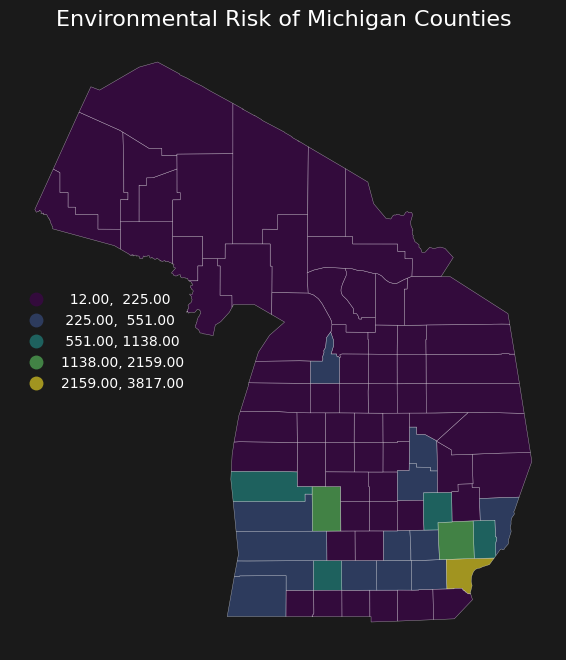

In [51]:
plot_map_by_column(
    gdf=final_enviscore, 
    column='EnvironmentalRisk', 
    color_ramp=ColorRamps.VIRIDIS, 
    scheme=Schemes.NATURAL_BREAKS,
    title="Environmental Risk of Michigan Counties"
)

<Axes: ylabel='Frequency'>

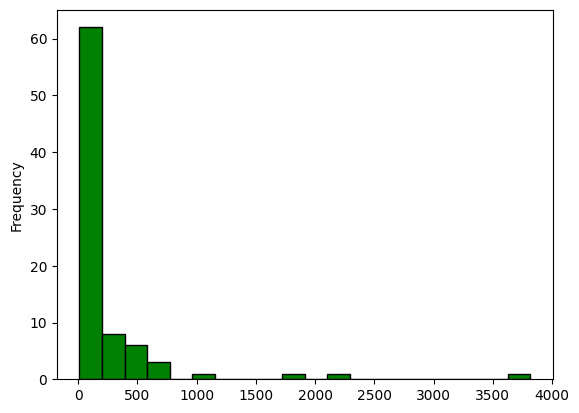

In [54]:
final_enviscore['EnvironmentalRisk'].plot.hist(bins=20, color='green', edgecolor='black')

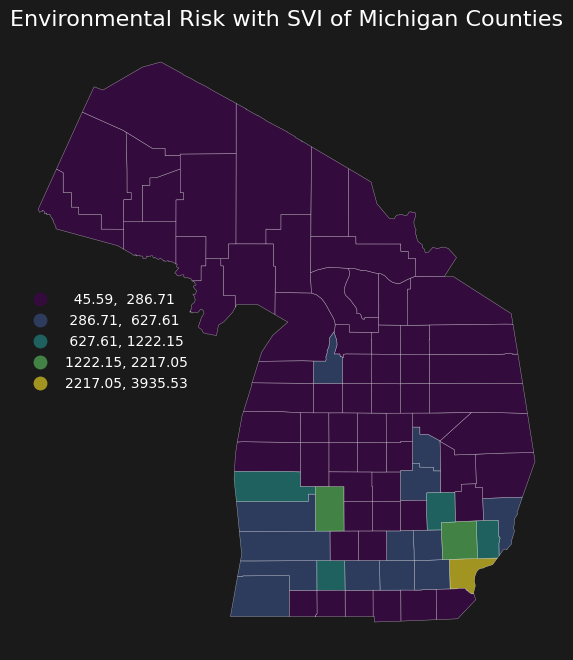

In [52]:
plot_map_by_column(
    gdf=final_enviscore, 
    column='EnvironmentalRiskSVI', 
    color_ramp=ColorRamps.VIRIDIS, 
    scheme=Schemes.NATURAL_BREAKS,
    title="Environmental Risk with SVI of Michigan Counties"
)

<Axes: ylabel='Frequency'>

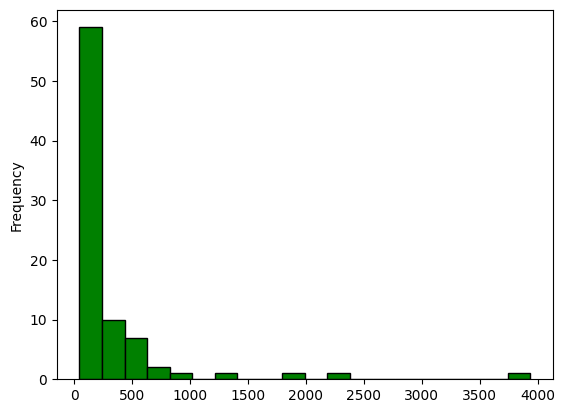

In [55]:
final_enviscore['EnvironmentalRiskSVI'].plot.hist(bins=20, color='green', edgecolor='black')

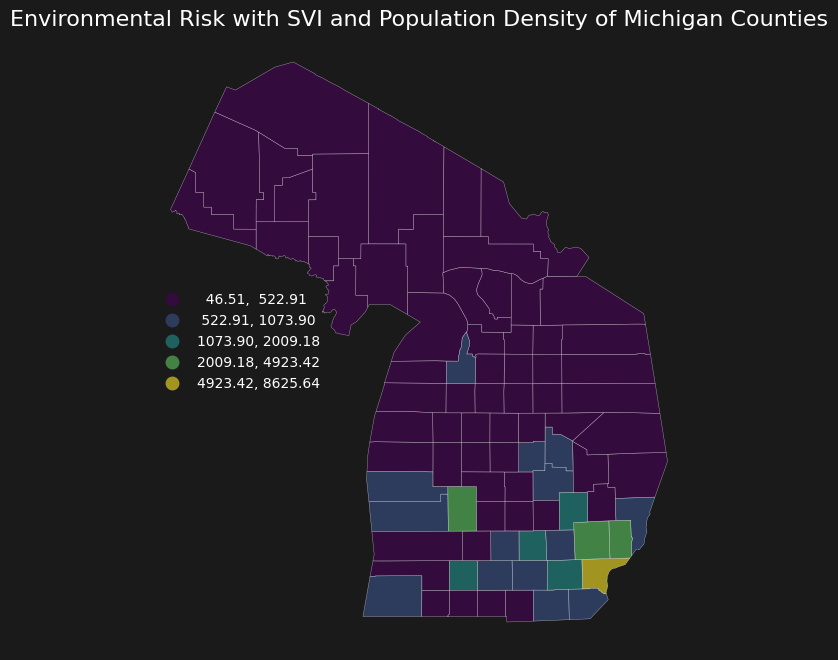

In [53]:
plot_map_by_column(
    gdf=final_enviscore, 
    column='EnvironmentalRiskSVIPop', 
    color_ramp=ColorRamps.VIRIDIS, 
    scheme=Schemes.NATURAL_BREAKS,
    title="Environmental Risk with SVI and Population Density of Michigan Counties"
)

<Axes: ylabel='Frequency'>

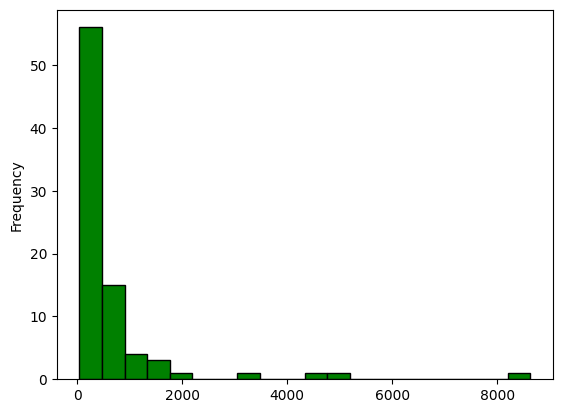

In [56]:
final_enviscore['EnvironmentalRiskSVIPop'].plot.hist(bins=20, color='green', edgecolor='black')